## Decision Tree Adventures 2 - Explanation of Decision Tree Classifier Parameters

### Abstract

Decision Tree Classifier model parameters are explained in this second notebook of Decision Tree Adventures. Tuning is not in the scope of this notebook. Models in the article was established to predict students success in math class depending on the features (gender, race/ethnicity, parental level of education, lunch, test preparation course). Students Performance dataset from kaggle is used. 

### Explanation of the Study

8 decision tree models have been established in this study. 

Initial Model was run with default parameters without any tuning and has an accuracy 56%.

In other models from 2 to 7, I have changed only one parameter and observed the results. The parameters used in each model from 2 to 7 are max_depth, min_samples_split, min_samples_leaf, max_leaf_nodes, gini + min_impurity_decrease, entropy + min_impurity_decrease respectively. Models have been run for different values of each parameter. The point is to find the best value for each parameter when they work alone. 

Each parameter's best values bring model accuracies almost to the same point, 68%. But these models produced two main trees for us. One of them is with around 5 terminal nodes and the other one is around 15. 

Model 2,3,4 and 6 (using parameters max_depth, min_samples_split, min_samples_leaf, gini + min_impurity_decrease respectively) produce the bigger trees with 14-20 terminal nodes. 

Model 7 (using parameter entropy + min_impurity_decrease) produces a smaller tree with 6 terminal nodes.  

Model 5 (using parameter max_leaf_nodes) proposes two alternatives. If you look at the figure "Model-5 Accuracy(%) vs max_leaf_nodes parameter", you will see that there are 2 peaks. In one of them number of terminal nodes 4-5 and in the other one it is 14. 

Model 8 is the final model for this study and we had to decide which parameters and values we would use. I preferred smaller tree and my vote went to use entropy for impurity calculation, Model 7's best value for min_impurity_decrease and Model 4's best value for min_samples_leaf. Here are my points to explain why:
* Most probably smaller tree would have lower variance. Please note that variance should be calculated and this decision should be based on these calculations. 
* I am for using min_impurity_decrease in decision tree models because you can be sure that tree grows only if there is place for impurity improvement. This is meaningful. 
* I think using min_samples_leaf with min_impurity_decrease is a good supportive parameter. Because even if there is a place to go further it stops you at a point and doesn't let you to have a tree with terminal nodes composed of really small number of samples.

In this study, I have applied only pre-pruning techniques and checked only accuracy. Of course we can reach better results by post-pruning and cross-validation techniques. And of course accuracy is not the only result we have to check. I will work on them in following articles. 

### Prepare Data for Modeling

In [1]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn import preprocessing
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
from sklearn import tree
import graphviz 
import numpy as np
from sklearn.externals.six import StringIO  
from IPython.display import Image  
from sklearn.tree import export_graphviz
import pydotplus

In [2]:
dataset = pd.read_csv("StudentsPerformance.csv")

dataset["math grade"] = ""
dataset.loc[(dataset["math score"] >= 60), "math grade"] = "Pass"
dataset.loc[(dataset["math score"] < 60), "math grade"] = "Fail"
dataset.drop(columns=['math score', 'reading score', 'writing score'], inplace=True)

one_hot = pd.get_dummies(dataset['gender'], prefix='gender', drop_first=True)
dataset = dataset.join(one_hot)
one_hot = pd.get_dummies(dataset['race/ethnicity'], prefix='race/ethnicity', drop_first=True)
dataset = dataset.join(one_hot)
one_hot = pd.get_dummies(dataset['parental level of education'], prefix='parental level of education', drop_first=True)
dataset = dataset.join(one_hot)
one_hot = pd.get_dummies(dataset['lunch'], prefix='lunch', drop_first=True)
dataset = dataset.join(one_hot)
one_hot = pd.get_dummies(dataset['test preparation course'], prefix='test preparation course', drop_first=True)
dataset = dataset.join(one_hot)

data_train, data_test_hold = train_test_split(dataset, test_size=0.30, random_state=21)
data_test, data_hold = train_test_split(data_test_hold, test_size=0.33, random_state=21)

columns_move = ["gender", "race/ethnicity", "parental level of education", "lunch", "test preparation course", "gender_male", "race/ethnicity_group B", "race/ethnicity_group C", "race/ethnicity_group D", "race/ethnicity_group E", "parental level of education_bachelor's degree", "parental level of education_high school", "parental level of education_master's degree", "parental level of education_some college", "parental level of education_some high school", "lunch_standard", "test preparation course_none"]

y_train = data_train["math grade"].values
X_train = data_train[columns_move].values
y_test = data_test["math grade"].values
X_test = data_test[columns_move].values

### Establish the Initial Model without Tuning

Model Accuracy: 56.22 %


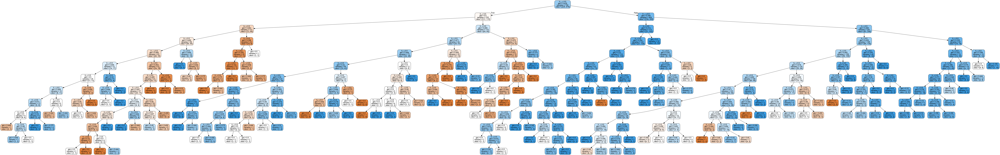

In [3]:
model = DecisionTreeClassifier(criterion='gini', splitter='best', 
                               max_depth=None, min_samples_split=2, 
                               min_samples_leaf=1, min_weight_fraction_leaf=0.0, 
                               max_features=None, random_state=None, 
                               max_leaf_nodes=None, min_impurity_decrease=0.0, 
                               min_impurity_split=None, class_weight=None, 
                               presort=False)

model.fit(X_train[:,5:], y_train)

y_pred = model.predict(X_test[:,5:])
print("Model Accuracy: %.2f" % (accuracy_score(y_test,y_pred)*100), "%")

dot_data = StringIO()
export_graphviz(model, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True)
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())

### Comments about Initial Model
Model was established with the default parameters of the method. That is why decision tree is big when you compare it with the others.

At the same time, it is an example of overfitting. To validate it, I made predictions by using training data and the accuracy was around 80% which is much higher than 56%. Having almost a flip-coin accuracy rate 56% with test set and having 80% accuracy rate with training set implies an overfitting.   

### Explain Parameters
#### random_state : int, RandomState instance or None, optional (default=None)
I changed the order and put it to the beginning. If you don't want any randomness about creating the model just write any number and always use it. In our case I will write 21 and keep it through all examples.

#### criterion : string, optional (default=”gini”)
Possible options are "gini" and "entropy". Both "gini-index" and "cross-entropy" are values to show the node purity. When the node is purer, value of gini-index or cross-entropy is smaller and close to zero. Decision tree algorithm splits nodes as long as this value decreases till it reaches zero or there is no other parameter to stop it. For now, lets continue with gini.

#### splitter : string, optional (default=”best”)
If you have so many parameters and if you know that all these parameters are relevant for the tree then you can choose "random" to save training time but I am sure most of the time, may be even all the time, you will use the default one, best.

#### max_depth : int or None, optional (default=None)
The maximum depth of the tree. If None, then nodes are expanded until all nodes are pure or until all nodes contain less than min_samples_split samples.

### Establish Model-2
* Take the initial model
* Set random_state=21 (it will be the same for all models) 
* Set max_depth with different numbers from 1 to 15: [1,2,3,4,5,6,7,8,9,10,11,12,13,14,15].

    max_depth   accuracy
0         1.0  64.179104
1         2.0  68.159204
2         3.0  67.164179
3         4.0  68.656716
4         5.0  65.671642
5         6.0  66.169154
6         7.0  63.681592
7         8.0  62.686567
8         9.0  63.681592
9        10.0  58.706468
10       11.0  57.711443
11       12.0  56.716418
12       13.0  56.716418
13       14.0  56.716418
14       15.0  56.716418



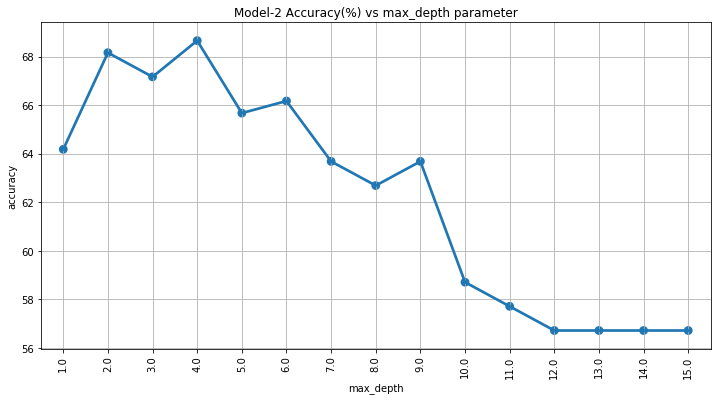

In [4]:
c_parameter_name = 'max_depth'
c_parameter_values = [1,2,3,4,5,6,7,8,9,10,11,12,13,14,15]
c_best_parameter = 0
c_best_accuracy = 0
c_worst_parameter = 0
c_worst_accuracy = 100

df = pd.DataFrame(columns=[c_parameter_name, 'accuracy'])

for input_parameter in c_parameter_values:
    model = DecisionTreeClassifier(criterion='gini', splitter='best', 
                                   max_depth=input_parameter, min_samples_split=2, 
                                   min_samples_leaf=1, min_weight_fraction_leaf=0.0, 
                                   max_features=None, random_state=21, 
                                   max_leaf_nodes=None, min_impurity_decrease=0.0, 
                                   min_impurity_split=None, class_weight=None, 
                                   presort=False)

    model.fit(X_train[:,5:], y_train)

    y_pred = model.predict(X_test[:,5:])
    
    acc_score = accuracy_score(y_test,y_pred)*100
    
    df = df.append({c_parameter_name : input_parameter , 'accuracy' : acc_score}, ignore_index=True)
    
    if acc_score > c_best_accuracy:
        c_best_accuracy = acc_score
        c_best_parameter = input_parameter
        c_best_model = model
        
    if acc_score < c_worst_accuracy:
        c_worst_accuracy = acc_score
        c_worst_parameter = input_parameter
        c_worst_model = model
    
print(df)
print("")

plt.figure(figsize=(12,6))
sns.pointplot(x=c_parameter_name, y="accuracy", data=df)
title = 'Model-2 Accuracy(%) vs ' + c_parameter_name + ' parameter'
plt.title(title)
plt.xticks(rotation= 90)
plt.grid()

BEST PERFORMANCE TREE, max_depth = 4 , accuracy = 68.66


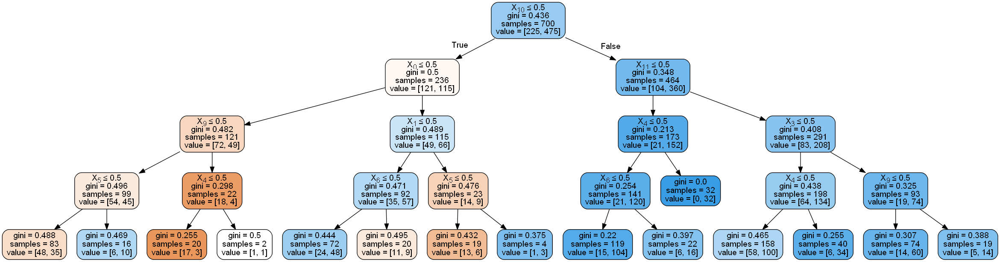

In [5]:
print("BEST PERFORMANCE TREE,", c_parameter_name, "=", c_best_parameter, ", accuracy = %.2f" % (c_best_accuracy))
dot_data = StringIO()
export_graphviz(c_best_model, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True)
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())

WORST PERFORMANCE TREE, max_depth = 12 , accuracy = 56.72


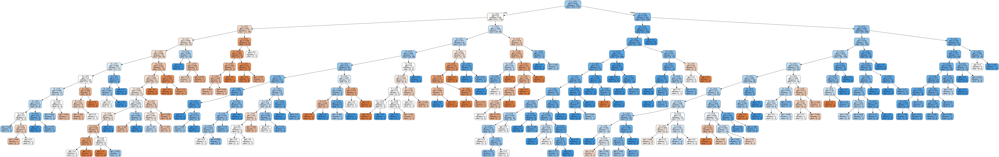

In [6]:
print("WORST PERFORMANCE TREE,", c_parameter_name, "=", c_worst_parameter, ", accuracy = %.2f" % (c_worst_accuracy))
dot_data = StringIO()
export_graphviz(c_worst_model, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True)
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())

### Comments about Model-2
Highest accuracy is achieved when max_depth=4. Besides, max_depth=2 or max_depth=3 also have better accuracies when compared to others. It is obvious that in our case, there is no need for a deeper tree, a tree with depth between 2 and 4 is enough to make better predictions.

Accuracy vs max_depth figure also tells us that prediction accuracies are decreasing with increasing depths. Lower depth models are better in generalization than higher depth models.  

I am not a big fan of this parameter. It can cut the tree at a point where there are still a lot way to go and it is still splittable. There are parameters I like more. We will see them soon. 

We choose max_depth = 4 for our Model-2 and proceed to other parameters. 

### Explain Parameters
#### min_samples_split : int, float, optional (default=2)
The minimum number of samples required to split a node. If this parameter is set as 20 and if a node includes samples less than 20, it means this is the last node (which means terminal node or leaf) and it is not splittable any more.

### Establish Model-3
* Take the initial model
* Set random_state=21
* Set min_samples_split with different numbers from 5 to 400: [5,10,15,20,25,30,35,40,45,50,55,60,65,70,75,80,85,90,95,100,105,110,115,120,125,130,135,140,200,250,300,350,400].

Instead of max_depth, we use min_samples_split. Assume that min_samples_split=50, then we will observe that any node with less than 50 samples will not splitted. Therefore all terminal nodes will have number of samples less than 50 and all internal nodes will have samples more than 50 (or equal). 

    min_samples_split   accuracy
0                 5.0  57.213930
1                10.0  57.711443
2                15.0  57.213930
3                20.0  59.203980
4                25.0  60.696517
5                30.0  61.194030
6                35.0  65.671642
7                40.0  67.164179
8                45.0  67.164179
9                50.0  67.164179
10               55.0  67.164179
11               60.0  67.164179
12               65.0  67.164179
13               70.0  67.164179
14               75.0  68.159204
15               80.0  68.159204
16               85.0  68.656716
17               90.0  68.656716
18               95.0  68.656716
19              100.0  67.164179
20              105.0  67.164179
21              110.0  67.164179
22              115.0  67.164179
23              120.0  68.159204
24              125.0  68.159204
25              130.0  68.159204
26              135.0  68.159204
27              140.0  68.159204
28              200.0  68.159204
29        

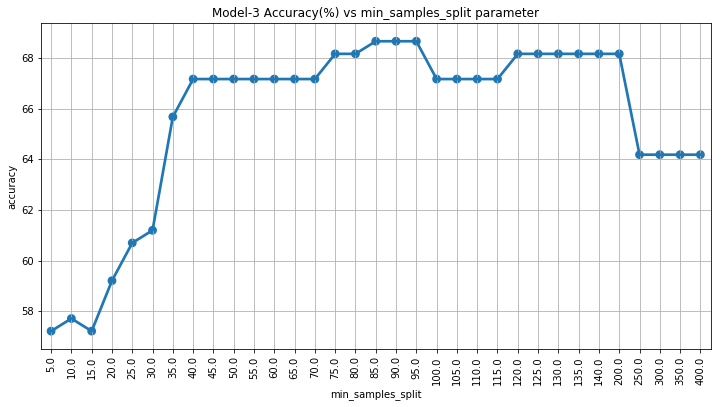

In [7]:
c_parameter_name = 'min_samples_split'
c_parameter_values = [5,10,15,20,25,30,35,40,45,50,55,60,65,70,75,80,85,90,95,
                       100,105,110,115,120,125,130,135,140,200,250,300,350,400]
c_best_parameter = 0
c_best_accuracy = 0
c_worst_parameter = 0
c_worst_accuracy = 100

df = pd.DataFrame(columns=[c_parameter_name, 'accuracy'])

for input_parameter in c_parameter_values:
    model = DecisionTreeClassifier(min_samples_split=input_parameter, random_state=21)

    model.fit(X_train[:,5:], y_train)

    y_pred = model.predict(X_test[:,5:])
    
    acc_score = accuracy_score(y_test,y_pred)*100
    
    df = df.append({c_parameter_name : input_parameter , 'accuracy' : acc_score}, ignore_index=True)
    
    if acc_score > c_best_accuracy:
        c_best_accuracy = acc_score
        c_best_parameter = input_parameter
        c_best_model = model
        
    if acc_score < c_worst_accuracy:
        c_worst_accuracy = acc_score
        c_worst_parameter = input_parameter
        c_worst_model = model
    
print(df)
print("")

plt.figure(figsize=(12,6))
sns.pointplot(x=c_parameter_name, y="accuracy", data=df)
title = 'Model-3 Accuracy(%) vs ' + c_parameter_name + ' parameter'
plt.title(title)
plt.xticks(rotation= 90)
plt.grid()

BEST PERFORMANCE TREE, min_samples_split = 85 , accuracy = 68.66


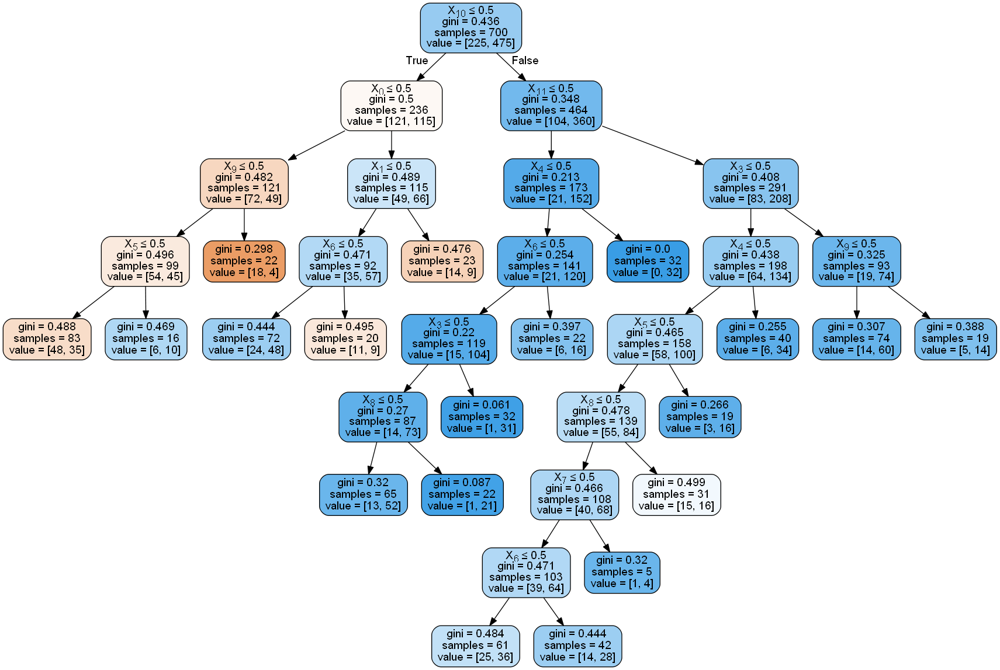

In [8]:
print("BEST PERFORMANCE TREE,", c_parameter_name, "=", c_best_parameter, ", accuracy = %.2f" % (c_best_accuracy))
dot_data = StringIO()
export_graphviz(c_best_model, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True)
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())

WORST PERFORMANCE TREE, min_samples_split = 5 , accuracy = 57.21


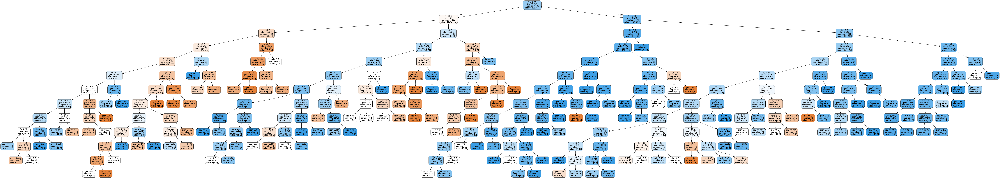

In [9]:
print("WORST PERFORMANCE TREE,", c_parameter_name, "=", c_worst_parameter, ", accuracy = %.2f" % (c_worst_accuracy))
dot_data = StringIO()
export_graphviz(c_worst_model, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True)
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())

### Comments about Model-3
We have reached similar results with min_samples_split instead of max_depth.

Values for min_samples_split between 40 and 200 look applicable. Overfitting starts for the values below 40, number of nodes increases and number of samples decreases in each node. On the other hand, over-generalization starts after 200, number of nodes decreases and number of samples increases in each node.

We choose min_samples_split = 85 for our Model-3 and proceed to other parameters.

### Explain Parameters
#### min_samples_leaf : int, float, optional (default=1)
The minimum number of samples required to be at a leaf node. Imagine such two cases: In both of the cases min_samples_leaf is set to 5 and our node has 20 samples. Now model will decide to go further by splitting it or to stop here. In the previous parameter, min_samples_split, this decision is made with these two information. But in this case, first we have to try to split  and see the number of samples in the left branch and right branch. In the first case lets say left has 8 samples and right has 12 samples. Both of them are larger than 5 so this split will be done. But if left was 4 and right was 16, since 4 is smaller than 5 this split will not be done and this unsplitted node will be a terminal node (leaf). Because any of its' branches shouldnt have less samples than this parameter. 

### Establish Model-4
* Take the initial model.
* Set random_state=21
* Set min_samples_leaf with different numbers from 5 to 200: [5,10,15,20,25,30,35,40,45,50,55,60,65,70,75,80,85,90,95,100,150,200].

It is min_samples_leaf's turn. It should contribute very similar results with min_samples_split. 

    min_samples_leaf   accuracy
0                5.0  57.213930
1               10.0  61.194030
2               15.0  64.676617
3               20.0  66.169154
4               25.0  66.169154
5               30.0  66.169154
6               35.0  68.159204
7               40.0  68.159204
8               45.0  68.159204
9               50.0  68.159204
10              55.0  68.159204
11              60.0  68.159204
12              65.0  68.159204
13              70.0  68.159204
14              75.0  68.159204
15              80.0  68.159204
16              85.0  68.159204
17              90.0  68.159204
18              95.0  68.159204
19             100.0  68.159204
20             150.0  64.179104
21             200.0  64.179104



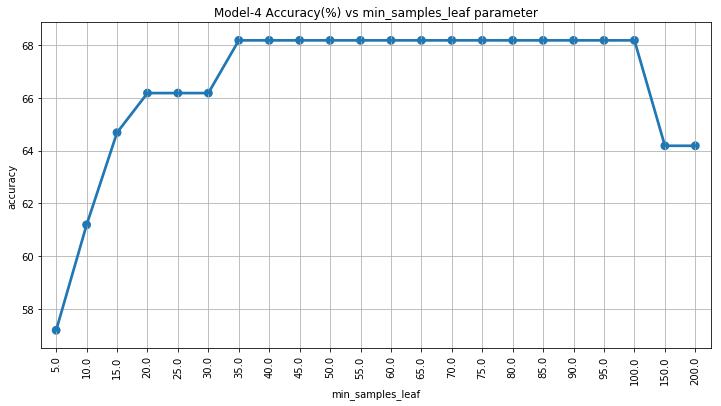

In [10]:
c_parameter_name = 'min_samples_leaf'
c_parameter_values = [5,10,15,20,25,30,35,40,45,50,55,60,65,70,75,80,85,90,95,100,150,200]
c_best_parameter = 0
c_best_accuracy = 0
c_worst_parameter = 0
c_worst_accuracy = 100

df = pd.DataFrame(columns=[c_parameter_name, 'accuracy'])

for input_parameter in c_parameter_values:
    model = DecisionTreeClassifier(min_samples_leaf=input_parameter, random_state=21)

    model.fit(X_train[:,5:], y_train)

    y_pred = model.predict(X_test[:,5:])
    
    acc_score = accuracy_score(y_test,y_pred)*100
    
    df = df.append({c_parameter_name : input_parameter , 'accuracy' : acc_score}, ignore_index=True)
    
    if acc_score > c_best_accuracy:
        c_best_accuracy = acc_score
        c_best_parameter = input_parameter
        c_best_model = model
        
    if acc_score < c_worst_accuracy:
        c_worst_accuracy = acc_score
        c_worst_parameter = input_parameter
        c_worst_model = model
    
print(df)
print("")

plt.figure(figsize=(12,6))
sns.pointplot(x=c_parameter_name, y="accuracy", data=df)
title = 'Model-4 Accuracy(%) vs ' + c_parameter_name + ' parameter'
plt.title(title)
plt.xticks(rotation= 90)
plt.grid()

BEST PERFORMANCE TREE, min_samples_leaf = 35 , accuracy = 68.16


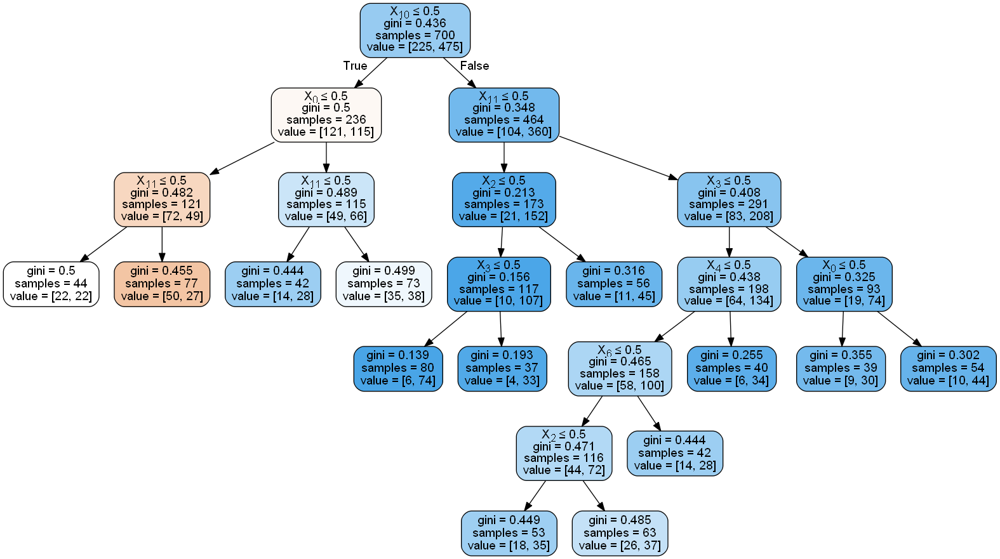

In [11]:
print("BEST PERFORMANCE TREE,", c_parameter_name, "=", c_best_parameter, ", accuracy = %.2f" % (c_best_accuracy))
dot_data = StringIO()
export_graphviz(c_best_model, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True)
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())

WORST PERFORMANCE TREE, min_samples_leaf = 5 , accuracy = 57.21


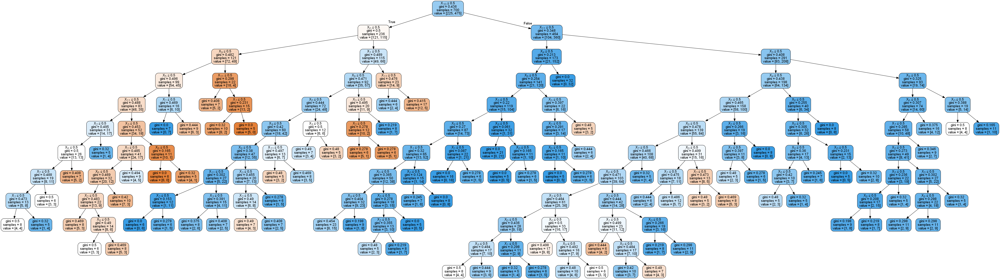

In [12]:
print("WORST PERFORMANCE TREE,", c_parameter_name, "=", c_worst_parameter, ", accuracy = %.2f" % (c_worst_accuracy))
dot_data = StringIO()
export_graphviz(c_worst_model, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True)
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())

### Comments about Model-4
There is no big difference. Values for min_samples_leaf between 35 and 100 look applicable. 

Just attention please to see how splitting change with these parameters. As you can observe in Model-3, the node at the left of 3rd level with 121 samples which was splitted as 99 and 22 using feature X9. On the other hand in Model-4, since min_samples_leaf=35 > 22, it ignores X9 and split as 44 and 77 using feature X11.

We choose min_samples_leaf = 35 for our Model-4 and proceed to other parameters.

### Explain Parameters
#### min_weight_fraction_leaf : float, optional (default=0.)
The minimum weighted fraction of the sum total of weights (of all the input samples) required to be at a leaf node. Samples have equal weight when sample_weight is not provided. This is a bit tricky parameter and to be honest difficult to understand at the beginning.

Imagine a case you have lots of samples and you want to use all of them but some of them are more trustable and some of them are not. Of course you can get rid of these samples but you don't want to delete them completely, you just want to use them with less importance. In this case, in the fit method, you have to give sample_weight parameter as a prerequisite. Otherwise min_weight_fraction_leaf parameter will just be ignored without any warning. When you give sample_weight, weights of your input samples are set. Then in the model, you can tell that a leaf with a lower weight than min_weight_fraction_leaf shouldn't be created. 

#### max_features : int, float, string or None, optional (default=None)
Max_feature is the number of features to consider each time to make the split decision. Lets say that dimension of the data is 80 and the max_feature is 20, each time you need to find the split, you randomly select 20 features and use them to decide which one of the 20 is the best feature to use. When you go to the next node you will select randomly another 20 and so on. In addition even if you set the number to 20, if you go deep you will end up using all the features, but each time you limit the set to 20.

#### max_leaf_nodes : int or None, optional (default=None)
Total number of terminal nodes (leaves) in a tree. 

### Establish Model-5
* Take the initial model.
* Set random_state=21.
* Set max_leaf_nodes with different numbers from 2 to 20: [2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20].

We are limiting the number of terminal nodes (leaves) to a certain number by setting max_leaf_nodes. In Model-4, number of terminal nodes were 12. It gives us just an idea. Lets see what will happen.

    max_leaf_nodes   accuracy
0              2.0  64.179104
1              3.0  64.179104
2              4.0  68.159204
3              5.0  68.159204
4              6.0  67.164179
5              7.0  67.164179
6              8.0  67.164179
7              9.0  67.164179
8             10.0  67.164179
9             11.0  66.666667
10            12.0  66.666667
11            13.0  66.666667
12            14.0  68.159204
13            15.0  67.661692
14            16.0  67.164179
15            17.0  67.164179
16            18.0  67.164179
17            19.0  67.661692
18            20.0  67.661692



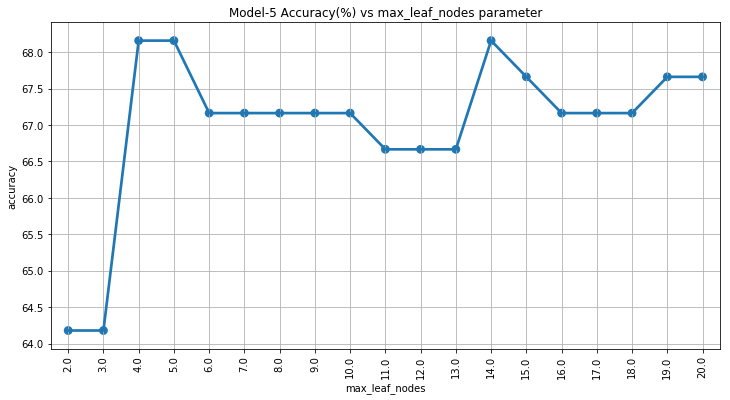

In [13]:
c_parameter_name = 'max_leaf_nodes'
c_parameter_values = [2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20]
c_best_parameter = 0
c_best_accuracy = 0
c_worst_parameter = 0
c_worst_accuracy = 100

df = pd.DataFrame(columns=[c_parameter_name, 'accuracy'])

for input_parameter in c_parameter_values:
    model = DecisionTreeClassifier(max_leaf_nodes=input_parameter, random_state=21)

    model.fit(X_train[:,5:], y_train)

    y_pred = model.predict(X_test[:,5:])
    
    acc_score = accuracy_score(y_test,y_pred)*100
    
    df = df.append({c_parameter_name : input_parameter , 'accuracy' : acc_score}, ignore_index=True)
    
    if acc_score > c_best_accuracy:
        c_best_accuracy = acc_score
        c_best_parameter = input_parameter
        c_best_model = model
        
    if acc_score < c_worst_accuracy:
        c_worst_accuracy = acc_score
        c_worst_parameter = input_parameter
        c_worst_model = model
    
print(df)
print("")

plt.figure(figsize=(12,6))
sns.pointplot(x=c_parameter_name, y="accuracy", data=df)
title = 'Model-5 Accuracy(%) vs ' + c_parameter_name + ' parameter'
plt.title(title)
plt.xticks(rotation= 90)
plt.grid()

BEST PERFORMANCE TREE, max_leaf_nodes = 4 , accuracy = 68.16


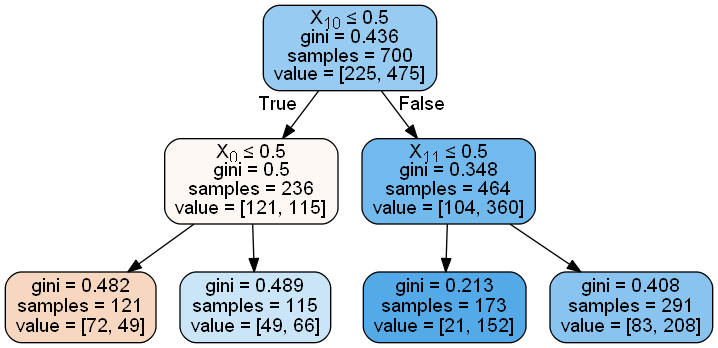

In [14]:
print("BEST PERFORMANCE TREE,", c_parameter_name, "=", c_best_parameter, ", accuracy = %.2f" % (c_best_accuracy))
dot_data = StringIO()
export_graphviz(c_best_model, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True)
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())

### Comments about Model-5
There are 2 hills. One of the is at max_leaf_nodes=4 or 5 and the other one is at max_leaf_nodes=14.

If you had to choose one of them, which one would you choose? My choice would be max_leaf_nodes=4 because it has more generalizing power and possibility of giving better results with new data.

That is why here we choose 4 leaves as our best model for Model-5.

I didn't draw worst model again and again, they are generally the same because of deep tree.

### Explain Parameters
#### min_impurity_decrease : float, optional (default=0.)

My favourite parameter, wisest one. According to the criterion parameter either gini-index or cross-entropy is used to calculate pureness of a split. Lets make an example:

We are creating a model to find whether a person is ill or not according to some of his features. In the model there are 100 samples, in the current node on which we will decide to split or not, there are 20 samples, 12 of them yes and 8 of them no. 

Step-1: Model calculate current node's pureness before any splitting:

P(yes) = 12 / 20 = 0.6
P(no) = 8 / 20 = 0.4
gini-index = 0.6 x 0.4 + 0.4 x 0.6 = 0.48

Step-2: Proceed as if you split this node by using possible features and calculate gini for each of them and compare it with the previous gini. Now we will make it with one feature only. Assume that if we split this node by using one of the features, in the left branch there are 13 samples (11 yes and 2 no), in the right branch there are 7 samples (1 yes and 6 no). 

Calculate it for both branches seperately first:

Left Branch;
P(yes) = 11 / 13 = 0.85
P(no) = 2 / 13 = 0.15
gini-index-left = 0.85 x 0.15 + 0.15 x 0.85 = 0.255

Right Branch;
P(yes) = 6 / 7 = 0.86
P(no) = 1 / 7 = 0.14
gini-index-right = 0.86 x 0.14 + 0.14 x 0.86 = 0.241 

Closer gini-index to zero means purer node. In our example, new branch nodes are purer then the original node with 20 samples.

Step-3: Calculate the weighted impurity decrease to understand that how much purer nodes you would have after this split if you make it.

N_t / N x (impurity - N_t_R / N_t x right_impurity - N_t_L / N_t x left_impurity)

where N is the total number of samples, N_t is the number of samples at the current node, N_t_L is the number of samples in the left child, and N_t_R is the number of samples in the right child.

20 / 100 x (0.48 - 7 / 20 x 0.241 - 13 / 20 x 0.255) = 0.046

Step-4: After calculating it for all features and find impurity decrease for all alternatives, the biggest one is choosen and compared with min_impurity_decrease. If it is bigger than min_impurity_decrease, then this split will be made.

Every split alternative is evaluated with this calculation and biggest impurity decrease is choosen. If min_impurity_decrease is set, tree stops to grow if any split can not decrease impurity more than min_impurity_decrease. It means there is no need to split more because your nodes will not be purer. What is the point of splitting then?

It is my favourite one for pre-pruning. It says continue splitting as long as there is value to continue splitting. I like using it with min_samples_leaf so I can tell the model continue splitting when there is a value in it but don't decrease under a certain number in terminal nodes because otherwise I can't trust the result.

This topic will be explained in detail in the article about mechanism of decision trees.

### Establish Model-6
* Take the inital model
* Set random_state=21
* Set min_impurity_decrease=[0.00005,0.0001,0.0002,0.0005,0.001,0.0015,0.002,0.005,0.01]

Now we will see the effects of min_impurity_decrease. 

   min_impurity_decrease   accuracy
0                0.00005  55.721393
1                0.00010  56.218905
2                0.00020  60.696517
3                0.00050  65.671642
4                0.00100  67.164179
5                0.00150  67.661692
6                0.00200  66.666667
7                0.00500  64.179104
8                0.01000  64.179104



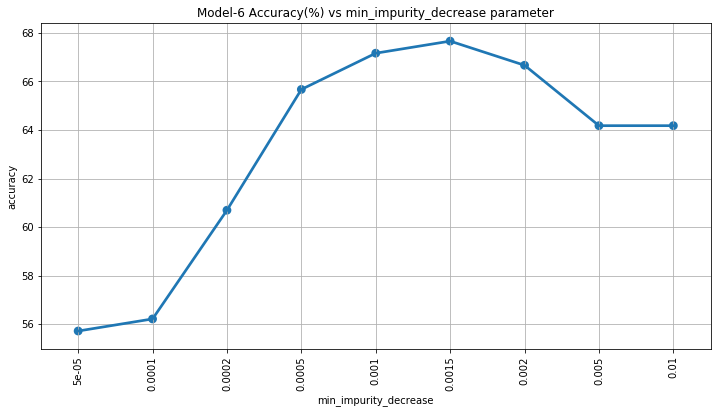

In [15]:
c_parameter_name = 'min_impurity_decrease'
c_parameter_values = [0.00005,0.0001,0.0002,0.0005,0.001,0.0015,0.002,0.005,0.01]
c_best_parameter = 0
c_best_accuracy = 0
c_worst_parameter = 0
c_worst_accuracy = 100

df = pd.DataFrame(columns=[c_parameter_name, 'accuracy'])

for input_parameter in c_parameter_values:
    model = DecisionTreeClassifier(min_impurity_decrease=input_parameter, random_state=21)

    model.fit(X_train[:,5:], y_train)

    y_pred = model.predict(X_test[:,5:])
    
    acc_score = accuracy_score(y_test,y_pred)*100
    
    df = df.append({c_parameter_name : input_parameter , 'accuracy' : acc_score}, ignore_index=True)
    
    if acc_score > c_best_accuracy:
        c_best_accuracy = acc_score
        c_best_parameter = input_parameter
        c_best_model = model
        
    if acc_score < c_worst_accuracy:
        c_worst_accuracy = acc_score
        c_worst_parameter = input_parameter
        c_worst_model = model
    
print(df)
print("")

plt.figure(figsize=(12,6))
sns.pointplot(x=c_parameter_name, y="accuracy", data=df)
title = 'Model-6 Accuracy(%) vs ' + c_parameter_name + ' parameter'
plt.title(title)
plt.xticks(rotation= 90)
plt.grid()

BEST PERFORMANCE TREE, min_impurity_decrease = 0.0015 , accuracy = 67.66


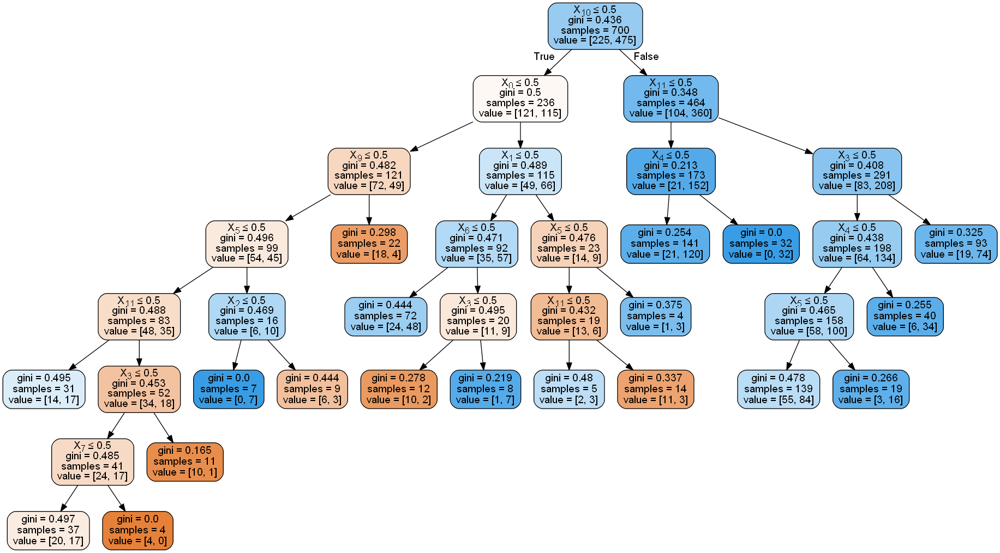

In [16]:
print("BEST PERFORMANCE TREE,", c_parameter_name, "=", c_best_parameter, ", accuracy = %.2f" % (c_best_accuracy))
dot_data = StringIO()
export_graphviz(c_best_model, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True)
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())

### Comments about Model-6
There is no improvement. On the other hand, this is more trustable than other parameters because it splits only if there is a value in splitting. 

We choose min_impurity_decrease = 0.0015 for our Model-6. What can we do more? We can try entropy as criterion.

### Establish Model-7
* Take the initial model
* Set random_state=21
* Set criterion='entropy'
* Set min_impurity_decrease=[0.0005,0.001,0.002,0.005,0.01,0.02,0.05,0.1,0.15,0.2,0.4]

    min_impurity_decrease   accuracy
0                  0.0005  60.199005
1                  0.0010  65.174129
2                  0.0020  67.661692
3                  0.0050  68.159204
4                  0.0100  64.179104
5                  0.0200  64.179104
6                  0.0500  64.179104
7                  0.1000  66.169154
8                  0.1500  66.169154
9                  0.2000  66.169154
10                 0.4000  66.169154



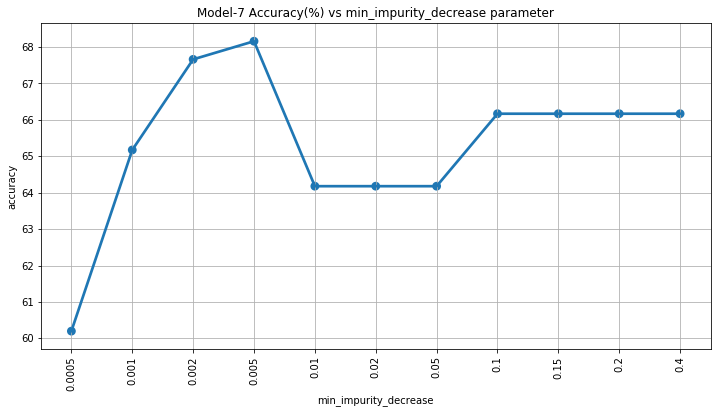

In [17]:
c_parameter_name = 'min_impurity_decrease'
c_parameter_values = [0.0005,0.001,0.002,0.005,0.01,0.02,0.05,0.1,0.15,0.2,0.4]
c_best_parameter = 0
c_best_accuracy = 0
c_worst_parameter = 0
c_worst_accuracy = 100

df = pd.DataFrame(columns=[c_parameter_name, 'accuracy'])

for input_parameter in c_parameter_values:
    model = DecisionTreeClassifier(criterion='entropy', min_impurity_decrease=input_parameter, random_state=21)

    model.fit(X_train[:,5:], y_train)

    y_pred = model.predict(X_test[:,5:])
    
    acc_score = accuracy_score(y_test,y_pred)*100
    
    df = df.append({c_parameter_name : input_parameter , 'accuracy' : acc_score}, ignore_index=True)
    
    if acc_score > c_best_accuracy:
        c_best_accuracy = acc_score
        c_best_parameter = input_parameter
        c_best_model = model
        
    if acc_score < c_worst_accuracy:
        c_worst_accuracy = acc_score
        c_worst_parameter = input_parameter
        c_worst_model = model
    
print(df)
print("")

plt.figure(figsize=(12,6))
sns.pointplot(x=c_parameter_name, y="accuracy", data=df)
title = 'Model-7 Accuracy(%) vs ' + c_parameter_name + ' parameter'
plt.title(title)
plt.xticks(rotation= 90)
plt.grid()

BEST PERFORMANCE TREE, min_impurity_decrease = 0.005 , accuracy = 68.16


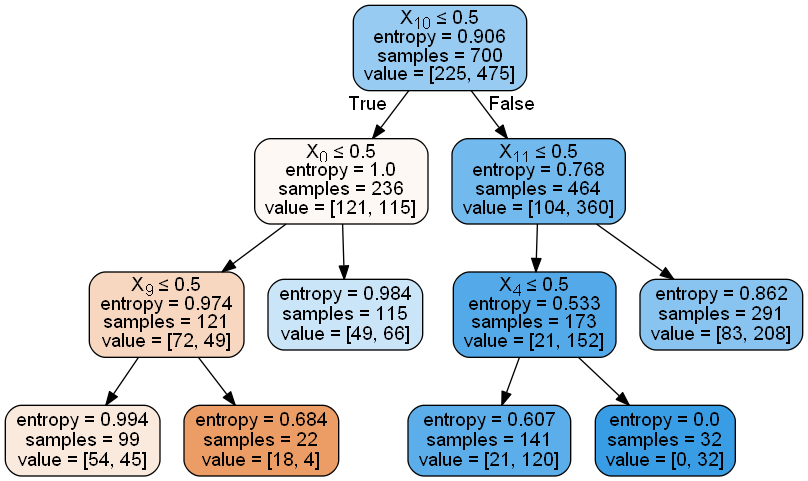

In [18]:
print("BEST PERFORMANCE TREE,", c_parameter_name, "=", c_best_parameter, ", accuracy = %.2f" % (c_best_accuracy))
dot_data = StringIO()
export_graphviz(c_best_model, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True)
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())

### Comments about Model-7
It gives almost similar results.

We choose min_impurity_decrease = 0.005 for our Model-7.

We can try a last model which can combine some of the parameters we have used in our previous models.

### Explain Parameters
#### min_impurity_split : float, (default=1e-7)
Forget about it, it is deprecated.
#### class_weight : dict, list of dicts, “balanced” or None, default=None
It is used to give weight to each class and tell which class deserves more weight. The class_weight='balanced' will also work, It just automatically adjusts weights according to the proportion of each class frequencies. 

In addition, it can be used while you are trying your model. Instead of adding or removing columns, by giving 0 to weight of that class, you can tell the model that ignore this feature. 

When I tried 'balanced' option, accuracy decreased. It means frequency in our classes are not balanced and to decrease the weight of less frequent ones by setting it as 'balanced' is ruining the model and it means that being less frequent doesn't make a class less important in our data and the model.

#### presort : bool, optional (default=False)
Whether to presort the data to speed up the finding of best splits in fitting. For the default settings of a decision tree on large datasets, setting this to true may slow down the training process. When using either a smaller dataset or a restricted depth, this may speed up the training.

### Establish Model-8
* Take the initial model
* Set random_state=21
* Set criterion='entropy'
* Set min_samples_leaf=35
* Set min_impurity_decrease=0.005

It is our last model. I changed only one parameter in other models just to show the effect of this parameter. In this last one, lets try to combine some of the parameters. Since entropy gives better results than gini we can choose entropy for impurity calculations. The other two are my favourite parameters, min_samples_leaf and min_impurity_decrease. Model will grow only if there is a value growing more (min_impurity_decrease) and it will stop at a certain point that there will be certain minimum number of samples in a terminal node (min_samples_leaf). I choose best parameter values from previous models.

Model Accuracy: 68.16 %


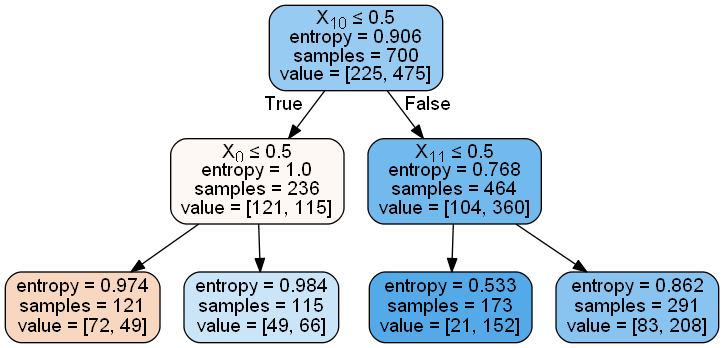

In [19]:
model = DecisionTreeClassifier(criterion='entropy', splitter='best', 
                               max_depth=None, min_samples_split=2, 
                               min_samples_leaf=35, min_weight_fraction_leaf=0.0, 
                               max_features=None, random_state=21, 
                               max_leaf_nodes=None, min_impurity_decrease=0.005, 
                               min_impurity_split=None, class_weight=None, 
                               presort=False)

model.fit(X_train[:,5:], y_train)

y_pred = model.predict(X_test[:,5:])
print("Model Accuracy: %.2f" % (accuracy_score(y_test,y_pred)*100), "%")

dot_data = StringIO()
export_graphviz(model, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True)
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())

### Comments about Model-8
There is no improvement in accuracy. On the other hand, I think this model is a stable and generalazing model (low variance). 